# Multi-label Amazon From Space

In [3]:
#@title

! pip -qq install tensorflow-addons
! pip install -qq -U tensorflow_datasets

IS_COLAB = 'google.colab' in str(get_ipython())

if IS_COLAB:
  from google.colab import drive
  drive.mount('/content/drive')

import tensorflow as tf
import tensorflow_addons as tfa

for d in tf.config.list_physical_devices('GPU'):
  print(d)
  print(f'Setting device {d} to memory-growth mode.')
  try:
    tf.config.experimental.set_memory_growth(d, True)
  except Exception as e:
    print(e)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
Setting device PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU') to memory-growth mode.


In [4]:
if IS_COLAB:
  base_dir = '/content/drive/MyDrive'
  data_dir = '/root/tensorflow_datasets'
else:
  base_dir = '/home/ldavid/Workspace'
  data_dir = '/home/ldavid/Workspace/datasets'


class Config:
  class data:
    path = f'{data_dir}/amazon-from-space'
    size = (256, 256)
    shape = (*size, 3)
    batch_size = 64
    shuffle_buffer_size = 8 * batch_size
    prefetch_buffer_size = tf.data.experimental.AUTOTUNE
    train_shuffle_seed = 2142
    shuffle = True

    valid_size = 0.3

    preprocess = tf.keras.applications.efficientnet.preprocess_input
    deprocess = lambda x: tf.cast(tf.clip_by_value(x, 0, 255), tf.uint8)

  class aug:
    brightness_delta =  .2
    saturation_lower =  .2
    saturation_upper = 1.0
    contrast_lower   =  .5
    contrast_upper   = 1.5
    hue_delta        =  .0
    
  class model:
    pool_layer = 'avg_pool'
    backbone = tf.keras.applications.EfficientNetB3

    build_options = {
      'predictions': {
        'kernel_regularizer': tf.keras.regularizers.L2(0.01),
        # 'bias_regularizer': tf.keras.regularizers.L2(0.01),
        # 'activity_regularizer': tf.keras.regularizers.L2(0.01),
      }
    }
  
  class training:
    epochs = 80
    learning_rate = .1
    
    loss = tf.losses.BinaryCrossentropy(from_logits=True)
    optimizer = tf.optimizers.SGD(
      learning_rate=learning_rate,
      momentum=0.9,
      nesterov=True
    )
    #optimizer = tfa.optimizers.SWA(optimizer)

    logs    = f'{base_dir}/logs/amazon-from-space-mo444/eb6-ce_swa_1-10_4/'
    weights = f'{base_dir}/models/amazon-from-space-mo444/eb6-ce_swa_1-10_4.h5'

    callbacks = [
      tf.keras.callbacks.TerminateOnNaN(),
      tf.keras.callbacks.ModelCheckpoint(weights, save_best_only=True, save_weights_only=True, verbose=1),
      tf.keras.callbacks.TensorBoard(logs, profile_batch=0),
      tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=0.001, verbose=1),
      tf.keras.callbacks.EarlyStopping(patience=20, min_delta=0.01, verbose=1),
    ]

  class fine_tuning:
    epochs = 80
    learning_rate = .01

    loss = tf.losses.BinaryCrossentropy(from_logits=True)
    # loss = tfa.losses.SigmoidFocalCrossEntropy(from_logits=True)
    optimizer = tf.optimizers.SGD(
      learning_rate=learning_rate,
      momentum=0.9,
      nesterov=True
    )
    optimizer = tfa.optimizers.SWA(optimizer)

    logs    = f'{base_dir}/logs/amazon-from-space-mo444/eb6-ce-swa_1-10_4_ft/'
    weights = f'{base_dir}/models/amazon-from-space-mo444/eb6-ce-swa_1-10_4_ft.h5'

    callbacks = [
      tf.keras.callbacks.TerminateOnNaN(),
      tfa.callbacks.AverageModelCheckpoint(filepath=weights, update_weights=True),
      #tf.keras.callbacks.ModelCheckpoint(weights, save_best_only=True, save_weights_only=True, verbose=1),
      tf.keras.callbacks.TensorBoard(logs, profile_batch=0, histogram_freq=1),
      tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=5, min_lr=0.0001, verbose=1),
      tf.keras.callbacks.EarlyStopping(patience=20, min_delta=0.01, verbose=1),
    ]

    unfreeze_layers = .6  # 60%
    frozen_bn = False

  class experiment:
    seed = 41248
    override = True

## Setup

In [5]:
import os
import shutil
from math import ceil

from typing import List, Optional

import numpy as np
import pandas as pd
import tensorflow_addons as tfa
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras import callbacks

In [6]:
for d in tf.config.list_physical_devices('GPU'):
  print(d)
  print(f'Setting device {d} to memory-growth mode.')
  try:
    tf.config.experimental.set_memory_growth(d, True)
  except Exception as e:
    print(e)

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
Setting device PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU') to memory-growth mode.


In [7]:
R = tf.random.Generator.from_seed(Config.experiment.seed, alg='philox')
C = np.asarray(sns.color_palette("Set1", 21))
CMAP = sns.color_palette("Set1", 21, as_cmap=True)

sns.set_style("whitegrid", {'axes.grid' : False})

In [8]:
def opt_or_default(options):
  def _get_options(param):
    return options.get(param, {})
  
  return _get_options


def normalize(x, reduce_min=True, reduce_max=True):
  if reduce_min: x -= tf.reduce_min(x, axis=(-3, -2), keepdims=True)
  if reduce_max: x = tf.math.divide_no_nan(x, tf.reduce_max(x, axis=(-3, -2), keepdims=True))

  return x


def visualize(
    image,
    title=None,
    rows=2,
    cols=None,
    figsize=(16, 7.2),
    cmap=None
):
  if image is not None:
    if isinstance(image, (list, tuple)) or len(image.shape) > 3:  # many images
      plt.figure(figsize=figsize)
      cols = cols or ceil(len(image) / rows)
      for ix in range(len(image)):
        plt.subplot(rows, cols, ix+1)
        visualize(image[ix],
                 cmap=cmap,
                 title=title[ix] if title is not None and len(title) > ix else None)
      plt.tight_layout()
      return

    if isinstance(image, tf.Tensor): image = image.numpy()
    if image.shape[-1] == 1: image = image[..., 0]
    plt.imshow(image, cmap=cmap)
  
  if title is not None: plt.title(title)
  plt.axis('off')

In [9]:
tf.keras.Model

tensorflow.python.keras.engine.training.Model

In [10]:
def unfreeze_top_layers(
    model: tf.keras.Model,
    layers: float,
    freeze_bn: bool
):
  if not layers:
    model.trainable = False
    return

  model.trainable = True

  frozen_layer_ix = int((1-layers) * len(model.layers))
  for ix, l in enumerate(model.layers):
    l.trainable = (ix > frozen_layer_ix and
                   (not isinstance(l, tf.keras.layers.BatchNormalization) or
                    not freeze_bn))
  
  print(f'Unfreezing {layers:.0%} layers. Bottom-most is the {frozen_layer_ix}-nth layer ({model.layers[frozen_layer_ix].name}).')

## Dataset

In [11]:
%%time
%%bash

if [ ! -d /root/tensorflow_datasets/amazon-from-space/ ]; then
  mkdir -p /root/tensorflow_datasets/amazon-from-space/

  gdown --id 11DFKx6xQ2-I_zgZtvxUrCjq-50odGP5N --output /root/tensorflow_datasets/amazon-from-space/train-jpg.tfrecords
  # If the above is not working:
  # cp /content/drive/MyDrive/datasets/amazon-from-space/train-jpg.tfrecords \
  #    /root/tensorflow_datasets/amazon-from-space/
else
  echo "Dir $data_path found. Skipping."
fi

Downloading...
From: https://drive.google.com/uc?id=11DFKx6xQ2-I_zgZtvxUrCjq-50odGP5N
To: /root/tensorflow_datasets/amazon-from-space/train-jpg.tfrecords
7.96GB [01:24, 94.5MB/s]


CPU times: user 846 ms, sys: 198 ms, total: 1.04 s
Wall time: 3min 23s


In [12]:
class AmazonFromSpace:
    num_train_samples = 40479
    num_test_samples  = 61191

    classes_ = np.asarray(
        ['agriculture', 'artisinal_mine', 'bare_ground', 'blooming', 'blow_down',
         'clear', 'cloudy', 'conventional_mine', 'cultivation', 'habitation', 'haze',
         'partly_cloudy', 'primary', 'road', 'selective_logging', 'slash_burn', 'water'])

    @classmethod
    def int2str(cls, indices):
        return cls.classes_[indices]
    
    @staticmethod
    def _bytes_feature(value):
        return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value.tobytes()]))

    @staticmethod
    def _int64_feature(value):
        return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))
    
    @staticmethod
    def decode_fn(record_bytes):
        r = tf.io.parse_single_example(record_bytes, {
          'filename': tf.io.FixedLenFeature([], tf.string),
          'image': tf.io.FixedLenFeature([], tf.string),
          'height': tf.io.FixedLenFeature([], tf.int64, default_value=[256]),
          'width': tf.io.FixedLenFeature([], tf.int64, default_value=[256]),
          'channels': tf.io.FixedLenFeature([], tf.int64, default_value=[3]),
          'label': tf.io.VarLenFeature(tf.int64),
        })
        
        r['image'] = tf.reshape(tf.io.decode_raw(r['image'], tf.uint8),
                                (r['height'], r['width'], r['channels']))
        r['label'] = tf.sparse.to_dense(r['label'])

        return r
    
    @classmethod
    def load(cls, tfrecords_path):
        return tf.data.TFRecordDataset(tfrecords_path).map(cls.decode_fn, num_parallel_calls=tf.data.AUTOTUNE)

In [13]:
CLASSES = AmazonFromSpace.classes_
int2str = AmazonFromSpace.int2str
num_samples = AmazonFromSpace.num_train_samples
num_train_samples = int((1-Config.data.valid_size)*num_samples)
num_valid_samples = int(Config.data.valid_size*num_samples)

In [14]:
from functools import partial


@tf.function
def load_fn(d, augment=False):
  image = d['image']
  labels = d['label']

  image = tf.cast(image, tf.float32)
  image = tf.ensure_shape(image, Config.data.shape)
  image = (augment_policy_fn(image)
           if augment
           else default_policy_fn(image))
  
  image = Config.data.preprocess(image)

  return image, labels_to_one_hot(labels)


def labels_to_one_hot(labels):
  return tf.reduce_max(
      tf.one_hot(labels, depth=CLASSES.shape[0]),
    axis=0)


def prepare(ds, batch_size, cache=False, shuffle=False, augment=False):
  if cache: ds = ds.cache()
  if shuffle: ds = ds.shuffle(Config.data.shuffle_buffer_size, reshuffle_each_iteration=True, seed=Config.data.train_shuffle_seed)

  return (ds.map(partial(load_fn, augment=augment), num_parallel_calls=tf.data.AUTOTUNE)
            .batch(batch_size, drop_remainder=True)
            .prefetch(Config.data.prefetch_buffer_size))

In [15]:
def default_policy_fn(image):
  return image


def augment_policy_fn(image):
  seeds = R.make_seeds(6)

  image = tf.image.stateless_random_flip_left_right(image, seed=seeds[:, 0])
  image = tf.image.stateless_random_flip_up_down(image, seed=seeds[:, 1])
  image = tf.image.stateless_random_hue(image, Config.aug.hue_delta, seed=seeds[:, 2])
  image = tf.image.stateless_random_brightness(image, Config.aug.brightness_delta, seed=seeds[:, 3])
  image = tf.image.stateless_random_contrast(image, Config.aug.contrast_lower, Config.aug.contrast_upper, seed=seeds[:, 4])
  image = tf.image.stateless_random_saturation(image, Config.aug.saturation_lower, Config.aug.saturation_upper, seed=seeds[:, 5])

  return image

In [16]:
train_dataset = AmazonFromSpace.load(f'{data_dir}/amazon-from-space/train-jpg.tfrecords')
valid_dataset = train_dataset.take(num_valid_samples)
train_dataset = train_dataset.skip(num_valid_samples)

train = prepare(train_dataset, Config.data.batch_size, shuffle=True, augment=True)
valid = prepare(valid_dataset, Config.data.batch_size)

In [17]:
#@title

for stage, batches, samples in zip(('training', 'validation', 'testing'),
                                   (train, valid),
                                   (AmazonFromSpace.num_train_samples,
                                    num_valid_samples,
                                    AmazonFromSpace.num_test_samples)):
  print(stage)
  print(f'  {batches}')
  print(f'  samples: {samples}')
  print(f'  steps  : {samples // Config.data.batch_size}')
  print()

training
  <PrefetchDataset shapes: ((64, 256, 256, 3), (64, 17)), types: (tf.float32, tf.float32)>
  samples: 40479
  steps  : 632

validation
  <PrefetchDataset shapes: ((64, 256, 256, 3), (64, 17)), types: (tf.float32, tf.float32)>
  samples: 12143
  steps  : 189



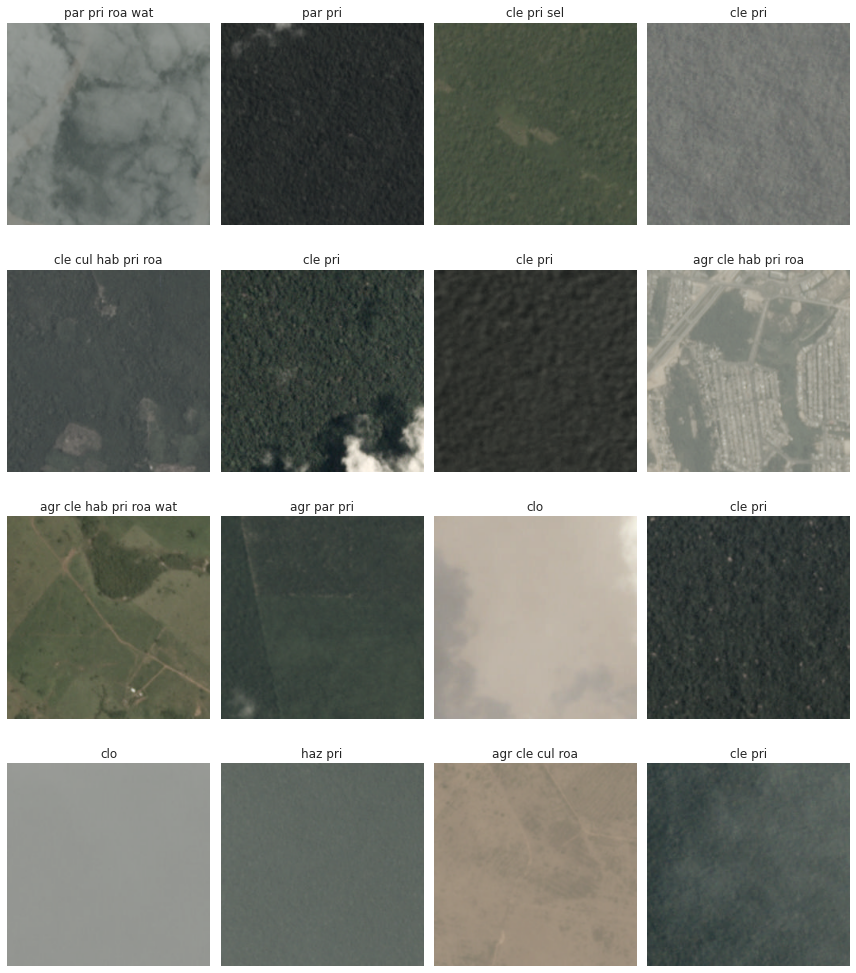

In [18]:
#@title

for images, labels in train.take(1):
  gt = [' '.join((e[:3] for e in CLASSES[l].astype(str))) for l in labels.numpy().astype(bool)]
  visualize(Config.data.deprocess(images[:16]), gt, rows=4, figsize=(12, 14));

## Network

### Backbone

In [19]:
print(f'Loading {Config.model.backbone.__name__}')

backbone = Config.model.backbone(
  classifier_activation=None,
  include_top=False,
  input_shape=Config.data.shape
)

Loading EfficientNetB3
43941888/43941136 [==============================] - 0s 0us/step


### Classification Head

In [20]:
from tensorflow.keras.layers import GlobalAveragePooling2D, Conv2D, Dropout, Dense


def build_classifier(opts):
  opts = opt_or_default(opts)

  x = tf.keras.Input(Config.data.shape, name='images')
  y = backbone(x)
  y = GlobalAveragePooling2D(name=Config.model.pool_layer)(y)
  y = Dense(len(CLASSES), name='predictions', **opts('predictions'))(y)

  return tf.keras.Model(
    inputs=x,
    outputs=y,
    name=f'clf_{Config.model.backbone.__name__}_voc12')

In [21]:
nn = build_classifier(Config.model.build_options)

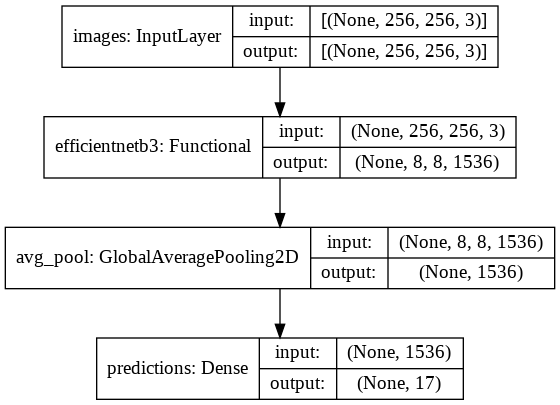

In [22]:
tf.keras.utils.plot_model(nn, show_shapes=True)

## Metrics

In [23]:
# Fix for tensorflow metrics that do not support
# sigmoid_crossentropy_with_logits, for some reason...

class FromLogitsMixin:
  def __init__(self, from_logits=False, *args, **kwargs):
    super().__init__(*args, **kwargs)
    self.from_logits = from_logits

  def update_state(self, y_true, y_pred, sample_weight=None):
    if self.from_logits:
      y_pred = tf.nn.sigmoid(y_pred)
    return super().update_state(y_true, y_pred, sample_weight)

In [24]:
class AUC(FromLogitsMixin, tf.metrics.AUC):
  ...

class BinaryAccuracy(FromLogitsMixin, tf.metrics.BinaryAccuracy):
  ...

class TruePositives(FromLogitsMixin, tf.metrics.TruePositives):
  ...

class FalsePositives(FromLogitsMixin, tf.metrics.FalsePositives):
  ...

class TrueNegatives(FromLogitsMixin, tf.metrics.TrueNegatives):
  ...

class FalseNegatives(FromLogitsMixin, tf.metrics.FalseNegatives):
  ...

class Precision(FromLogitsMixin, tf.metrics.Precision):
  ...

class Recall(FromLogitsMixin, tf.metrics.Recall):
  ...

class F1Score(FromLogitsMixin, tfa.metrics.F1Score):
  ...

class MultiLabelConfusionMatrix(FromLogitsMixin, tfa.metrics.MultiLabelConfusionMatrix):
  ...

## Training

In [25]:
def train_fn(
    epochs: int = 80,
    initial_epoch: int = 0,
    callbacks: Optional[List[tf.keras.callbacks.Callback]] = None,
    steps_per_epoch: Optional[int] = None,
    validation_steps: Optional[int] = None,

    logs: str = None,
    weights: str = None,
):
  try:
    if logs and os.path.exists(logs) and initial_epoch == 0:
      if not Config.experiment.override:
        raise ValueError(f'A training was found in {logs}. '
                         f'Either move it or set experiment.override to True.')

      print(f'Overriding previous training at {logs}.')
      shutil.rmtree(logs)
    
    if weights: os.makedirs(os.path.dirname(weights), exist_ok=True)

    nn.fit(
      train.repeat(),
      validation_data=valid.repeat(),
      epochs=epochs,
      steps_per_epoch=steps_per_epoch,
      validation_steps=validation_steps,
      initial_epoch=initial_epoch,
      callbacks=callbacks);

  except KeyboardInterrupt: print('\ninterrupted')
  else: print('\ndone')

### Top Classifier Training

In [26]:
backbone.trainable = False

In [27]:
nn.compile(
    optimizer=Config.training.optimizer,
    loss=Config.training.loss,
    metrics=[
      Precision(from_logits=True),
      Recall(from_logits=True),
      F1Score(num_classes=len(CLASSES), from_logits=True, average='macro'),
      MultiLabelConfusionMatrix(num_classes=len(CLASSES), from_logits=True),
      tf.metrics.AUC(multi_label=True, from_logits=True),
    ])

In [28]:
train_fn(
  epochs=Config.training.epochs,
  steps_per_epoch=num_train_samples // Config.data.batch_size,
  validation_steps=num_valid_samples // Config.data.batch_size,
  callbacks=Config.training.callbacks,
  logs=Config.training.logs,
  weights=Config.training.weights,
)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/80
442/442 [==============================] - ETA: 0s - loss: 0.2424 - precision: 0.8713 - recall: 0.7211 - f1_score: 0.0802 - Multilabel_confusion_matrix: 7072.0000 - auc: 0.7684

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric MultiLabelConfusionMatrix implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


442/442 [==============================] - 203s 403ms/step - loss: 0.2424 - precision: 0.8713 - recall: 0.7211 - f1_score: 0.0802 - Multilabel_confusion_matrix: 7072.0000 - auc: 0.7684 - val_loss: 0.2083 - val_precision: 0.8792 - val_recall: 0.7267 - val_f1_score: 0.0766 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc: 0.8005

Epoch 00001: val_loss improved from inf to 0.20834, saving model to /content/drive/MyDrive/models/amazon-from-space-mo444/eb6-ce_swa_1-10_4.h5
Epoch 2/80
442/442 [==============================] - 166s 372ms/step - loss: 0.2068 - precision: 0.8836 - recall: 0.7243 - f1_score: 0.0752 - Multilabel_confusion_matrix: 7072.0000 - auc: 0.7838 - val_loss: 0.2016 - val_precision: 0.8874 - val_recall: 0.7175 - val_f1_score: 0.0728 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc: 0.8042

Epoch 00002: val_loss improved from 0.20834 to 0.20161, saving model to /content/drive/MyDrive/models/amazon-from-space-mo444/eb6-ce_swa_1-10_4.h5
Epoch 3/80
442/442 [=======

### Fine-Tuning

In [29]:
trained_epochs = 31

backbone.trainable = False
nn.load_weights(Config.training.weights)

In [30]:
unfreeze_top_layers(
  backbone,
  Config.fine_tuning.unfreeze_layers,
  Config.fine_tuning.frozen_bn
)

nn.compile(
  optimizer=Config.fine_tuning.optimizer,
  loss=Config.fine_tuning.loss,
  metrics=[
    Precision(from_logits=True),
    Recall(from_logits=True),
    F1Score(num_classes=len(CLASSES), from_logits=True, average='macro'),
    MultiLabelConfusionMatrix(num_classes=len(CLASSES), from_logits=True),
    tf.metrics.AUC(multi_label=True, from_logits=True),
  ])

Unfreezing 60% layers. Bottom-most is the 153-nth layer (block4c_se_reshape).


In [31]:
train_fn(
  epochs=Config.fine_tuning.epochs,
  initial_epoch=trained_epochs,
  steps_per_epoch=num_train_samples // Config.data.batch_size,
  validation_steps=num_valid_samples // Config.data.batch_size,
  callbacks=Config.fine_tuning.callbacks,
  logs=Config.fine_tuning.logs,
  weights=Config.fine_tuning.weights,
)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 32/80
442/442 [==============================] - ETA: 0s - loss: 0.2021 - precision_1: 0.8892 - recall_1: 0.7157 - f1_score: 0.0942 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.7849

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric F1Score implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/metrics.py:257: UserWarning: Metric MultiLabelConfusionMatrix implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  'consistency.' % (self.__class__.__name__,))


442/442 [==============================] - 272s 541ms/step - loss: 0.2021 - precision_1: 0.8892 - recall_1: 0.7157 - f1_score: 0.0942 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.7849 - val_loss: 0.1652 - val_precision_1: 0.9048 - val_recall_1: 0.7808 - val_f1_score: 0.1482 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8389


Streaming output truncated to the last 5000 lines.
       -7.72365602e-04,  9.83879290e-05,  3.50367132e-04,  1.45060348e-03,
        9.83094447e-04, -3.93973663e-04, -7.10386492e-04,  1.64673594e-03,
        5.58855594e-04, -6.95176481e-04, -4.24686266e-04,  2.97645893e-04,
       -5.00079535e-04,  5.34232182e-04,  4.96922061e-04, -2.84852504e-05,
       -6.20903564e-04, -8.70135147e-04,  5.57599706e-04,  1.64972618e-04],
      dtype=float32)> : 'block5b_expand_bn/moving_mean_3750'
  warnings.warn("Unable to assign average slot to {} : {}".format(var, e))
/usr/local/lib/python3.7/dist-packages/tensorflow_addons/optimizers/average_wrapper.py:139: UserWarning: Unable to assign average slot to <tf.Variable 'block5b_expand_bn/moving_variance:0' shape=(816,) dtype=float32, numpy=
array([ 8.062425 , 19.043915 , 17.198452 , 29.784075 , 29.326565 ,
       13.839354 , 21.253654 , 17.992758 , 11.218585 , 15.493291 ,
       17.478512 , 22.891056 ,  9.050576 , 32.389816 , 12.942353 ,
        9.67

Epoch 33/80
442/442 [==============================] - 248s 554ms/step - loss: 0.1740 - precision_1: 0.9061 - recall_1: 0.7562 - f1_score: 0.1181 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8250 - val_loss: 0.1532 - val_precision_1: 0.9112 - val_recall_1: 0.7976 - val_f1_score: 0.1571 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8553


Streaming output truncated to the last 5000 lines.
array([ 8.018964 , 19.121176 , 17.436476 , 29.101192 , 29.693357 ,
       13.506462 , 21.394972 , 18.011381 , 11.03089  , 15.085726 ,
       17.311752 , 23.367481 ,  8.958995 , 32.36877  , 12.800795 ,
        9.713751 , 10.667107 , 15.8699665, 13.966086 , 13.462366 ,
       10.235092 , 24.16246  , 26.984255 ,  8.420407 , 34.02828  ,
        8.267592 , 17.61272  , 13.773655 , 13.941725 , 13.899749 ,
        9.723815 , 22.382479 , 14.367159 , 16.121359 , 11.508915 ,
        7.8851237, 16.808247 , 14.0912695, 10.836972 , 23.54661  ,
       14.832433 , 21.79931  ,  9.60092  , 14.478922 , 20.128004 ,
       26.275229 , 22.542883 , 15.0772505, 16.56939  , 14.368653 ,
       14.500432 , 17.201395 , 10.228463 , 15.710911 , 15.194885 ,
       34.000603 , 14.310361 ,  9.401139 , 12.914505 , 16.636158 ,
       13.892269 , 19.10955  , 15.642514 , 18.776869 , 28.915888 ,
       17.261345 , 16.187922 , 15.3095455, 11.78743  , 19.393845 ,
       14.9

Epoch 34/80
442/442 [==============================] - 250s 557ms/step - loss: 0.1676 - precision_1: 0.9069 - recall_1: 0.7662 - f1_score: 0.1243 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8340 - val_loss: 0.1490 - val_precision_1: 0.9149 - val_recall_1: 0.8046 - val_f1_score: 0.1598 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8623


Streaming output truncated to the last 5000 lines.
       -5.83345362e-04, -3.09359166e-05, -1.40023697e-03,  8.60515982e-04,
       -7.72581785e-04,  9.96241288e-05,  3.54652118e-04,  1.44554768e-03,
        9.76890209e-04, -3.91261798e-04, -7.10212218e-04,  1.64808636e-03,
        5.62243746e-04, -6.91284658e-04, -4.26191313e-04,  2.99648120e-04,
       -4.97759960e-04,  5.34827879e-04,  5.00775408e-04, -2.84218077e-05,
       -6.24431879e-04, -8.68443109e-04,  5.51507226e-04,  1.63646444e-04],
      dtype=float32)> : 'block5b_expand_bn/moving_mean_3750'
  warnings.warn("Unable to assign average slot to {} : {}".format(var, e))
/usr/local/lib/python3.7/dist-packages/tensorflow_addons/optimizers/average_wrapper.py:139: UserWarning: Unable to assign average slot to <tf.Variable 'block5b_expand_bn/moving_variance:0' shape=(816,) dtype=float32, numpy=
array([ 8.020327 , 19.063284 , 17.637827 , 28.960499 , 30.227951 ,
       13.091875 , 21.340437 , 18.00132  , 10.886311 , 14.989352 ,
    

Epoch 35/80
442/442 [==============================] - 252s 559ms/step - loss: 0.1634 - precision_1: 0.9097 - recall_1: 0.7733 - f1_score: 0.1275 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8420 - val_loss: 0.1460 - val_precision_1: 0.9146 - val_recall_1: 0.8101 - val_f1_score: 0.1662 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8698


Streaming output truncated to the last 5000 lines.
        1.40937197e-03, -4.34663089e-04, -1.45659072e-03,  2.53544073e-04,
       -1.16059021e-03,  1.76812129e-04, -1.86257483e-03, -5.24854462e-04,
        6.92991132e-04,  5.39538683e-04, -1.71692518e-03,  1.82906515e-05,
        5.21508511e-04,  1.28164492e-03, -2.02192139e-04, -1.88684382e-04,
        4.01935773e-04,  2.10887892e-03, -9.56956821e-04, -1.53921661e-03,
       -5.85772679e-04, -3.20735417e-05, -1.39867445e-03,  8.60415108e-04,
       -7.71293009e-04,  9.80447076e-05,  3.59303813e-04,  1.44370284e-03,
        9.79841570e-04, -3.92872200e-04, -7.11114961e-04,  1.65004947e-03,
        5.62448578e-04, -6.93557435e-04, -4.22884186e-04,  2.96517741e-04,
       -4.99852060e-04,  5.34570310e-04,  5.02451789e-04, -2.57111114e-05,
       -6.24336186e-04, -8.70209711e-04,  5.46985772e-04,  1.63749297e-04],
      dtype=float32)> : 'block5b_expand_bn/moving_mean_3750'
  warnings.warn("Unable to assign average slot to {} : {}".for

Epoch 36/80
442/442 [==============================] - 252s 562ms/step - loss: 0.1612 - precision_1: 0.9097 - recall_1: 0.7758 - f1_score: 0.1293 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8460 - val_loss: 0.1439 - val_precision_1: 0.9161 - val_recall_1: 0.8125 - val_f1_score: 0.1682 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8730


Streaming output truncated to the last 5000 lines.
        1.40956778e-03, -4.33465670e-04, -1.45496614e-03,  2.50912883e-04,
       -1.16161897e-03,  1.74975590e-04, -1.86341803e-03, -5.26375428e-04,
        6.89747394e-04,  5.37020736e-04, -1.70799263e-03,  1.81427076e-05,
        5.21724811e-04,  1.28402654e-03, -2.02340641e-04, -1.90095758e-04,
        4.03915823e-04,  2.11182772e-03, -9.56294767e-04, -1.53643475e-03,
       -5.84933790e-04, -3.29301365e-05, -1.40153745e-03,  8.56788014e-04,
       -7.70500337e-04,  9.92646819e-05,  3.55878554e-04,  1.44441007e-03,
        9.79105942e-04, -3.92446877e-04, -7.15614413e-04,  1.65046495e-03,
        5.62742120e-04, -6.93932350e-04, -4.23009449e-04,  2.97866529e-04,
       -4.93825530e-04,  5.35590865e-04,  5.02524606e-04, -2.45322808e-05,
       -6.20041450e-04, -8.70308781e-04,  5.50310651e-04,  1.64374709e-04],
      dtype=float32)> : 'block5b_expand_bn/moving_mean_3750'
  warnings.warn("Unable to assign average slot to {} : {}".for

Epoch 37/80
442/442 [==============================] - 245s 547ms/step - loss: 0.1594 - precision_1: 0.9096 - recall_1: 0.7792 - f1_score: 0.1323 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8497 - val_loss: 0.1431 - val_precision_1: 0.9161 - val_recall_1: 0.8140 - val_f1_score: 0.1707 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8742


Streaming output truncated to the last 5000 lines.
        1.15397375e-03, -8.79329105e-04,  1.75238136e-04,  9.06833913e-04,
        1.45294738e-03, -5.49099175e-04,  6.13381635e-05, -1.51061322e-04,
        6.51548093e-04, -8.09823279e-04, -9.35940130e-04,  2.52513937e-03,
        3.67834291e-04, -8.01712158e-05, -8.72593431e-04,  1.47967413e-03,
        3.77726101e-04, -4.96389635e-04, -1.19792682e-03, -6.95107505e-04,
        3.79981520e-06, -2.19709333e-03,  6.57288940e-04,  1.85207522e-03,
       -1.12556817e-03,  2.31195969e-04, -9.96476956e-06,  2.59565888e-04,
        1.86844310e-03,  4.34592599e-04, -1.11126050e-03,  1.67927030e-03,
       -3.21113854e-04, -5.99411258e-04,  1.76017653e-04,  8.02824507e-04,
        3.43325191e-05, -2.61554495e-04,  1.13057664e-04,  1.04652334e-03,
        7.38731353e-04,  1.79984490e-04, -9.11772775e-04,  2.72589095e-04,
        4.71826905e-04, -9.46855231e-04,  3.25773231e-04,  1.09011005e-03,
       -1.97346136e-03,  8.27183714e-04,  3.49382

Epoch 38/80
442/442 [==============================] - 246s 550ms/step - loss: 0.1579 - precision_1: 0.9111 - recall_1: 0.7823 - f1_score: 0.1351 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8543 - val_loss: 0.1418 - val_precision_1: 0.9174 - val_recall_1: 0.8168 - val_f1_score: 0.1739 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8746


Streaming output truncated to the last 5000 lines.
        3.78746103e-04,  5.23121795e-04, -1.28824066e-03,  9.24326421e-04,
       -1.49288127e-04, -1.34077913e-04,  3.64139618e-04, -1.03024545e-03,
       -8.13939550e-04, -5.43958868e-06,  1.63969840e-03,  1.30217843e-04,
       -9.24163731e-04,  2.88268406e-04,  1.69758289e-03,  3.46698856e-04,
       -1.40662899e-03, -1.31926150e-03,  9.73981281e-04, -3.22289445e-04,
        2.26565331e-04, -1.46609859e-03,  2.20167823e-03, -1.19242512e-04,
        9.27646688e-05,  1.11742433e-04, -6.76870171e-04,  8.50716780e-04,
       -1.36420596e-03, -3.87880224e-04, -4.98661648e-05,  3.76654614e-04,
        2.55788735e-04, -1.27560936e-03, -2.69778218e-04, -1.00104917e-04,
       -1.14400918e-03, -7.35236041e-04,  8.65071663e-04, -4.73765598e-04,
        9.13391646e-04,  5.04226715e-04, -6.66384643e-04, -1.08236936e-03,
        1.41213345e-03,  2.09594052e-03, -1.01784803e-03,  2.51827267e-04,
       -8.48135503e-04, -8.81349086e-04,  8.38115

Epoch 39/80
442/442 [==============================] - 247s 550ms/step - loss: 0.1566 - precision_1: 0.9097 - recall_1: 0.7846 - f1_score: 0.1349 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8515 - val_loss: 0.1408 - val_precision_1: 0.9163 - val_recall_1: 0.8188 - val_f1_score: 0.1739 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8766


Streaming output truncated to the last 5000 lines.
        8.72987206e-04,  8.96603859e-04,  8.77442770e-04,  3.68331588e-04,
       -1.16963056e-03, -4.43727709e-04,  6.30866634e-05,  5.60339133e-04,
       -9.08215065e-04, -4.17477684e-04,  1.41442136e-03, -1.27462577e-03,
        1.06373406e-03,  9.58506425e-04, -2.26340303e-03,  7.03093683e-05,
       -1.21429184e-05,  2.92529410e-04,  4.19778080e-04, -6.14592747e-04,
        4.95645218e-04, -3.47340625e-04,  1.20550953e-03,  5.95582387e-05,
       -1.12689042e-03,  4.14577138e-04, -7.96446519e-04,  1.15547737e-03,
       -1.96683119e-04, -4.80491901e-04,  6.41213728e-06,  9.16106976e-04,
        5.74751932e-04,  1.82948867e-03, -1.22016172e-04, -1.80147216e-03,
       -1.40093605e-03,  2.88748735e-04, -7.72809028e-04,  2.99704319e-04,
       -6.61114696e-04,  2.02199051e-04,  9.10545175e-04,  5.38475404e-04,
       -1.09911710e-03, -3.95285431e-04, -6.08878145e-05,  5.86312672e-05,
        1.04117126e-03, -9.15456505e-04,  1.06163

Epoch 40/80
442/442 [==============================] - 256s 572ms/step - loss: 0.1558 - precision_1: 0.9111 - recall_1: 0.7852 - f1_score: 0.1350 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8542 - val_loss: 0.1406 - val_precision_1: 0.9186 - val_recall_1: 0.8201 - val_f1_score: 0.1760 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8792


Streaming output truncated to the last 5000 lines.
        2.28429664e-04, -1.46495097e-03,  2.20300094e-03, -1.19073411e-04,
        8.95825287e-05,  1.10446555e-04, -6.73513103e-04,  8.51160265e-04,
       -1.36169884e-03, -3.86594766e-04, -4.95355962e-05,  3.79653589e-04,
        2.54782644e-04, -1.27454323e-03, -2.68684991e-04, -9.60225079e-05,
       -1.14604039e-03, -7.33729452e-04,  8.60364176e-04, -4.72880260e-04,
        9.14926059e-04,  5.05430449e-04, -6.66989130e-04, -1.08160533e-03,
        1.41388876e-03,  2.09549372e-03, -1.01908704e-03,  2.49597739e-04,
       -8.50636337e-04, -8.82294844e-04,  8.64082758e-05,  3.26565438e-04,
       -2.96582177e-04,  3.33773060e-04, -1.17322942e-03,  8.18769040e-04,
       -5.69877448e-04,  4.46311169e-04,  1.56042154e-03, -5.22837683e-04,
        2.75951781e-04,  8.40153836e-04, -6.48121058e-04,  7.92636711e-04,
        8.08613258e-04, -2.00212747e-03,  1.77335969e-04, -1.91308427e-04,
        1.67809252e-03, -1.74536777e-04, -4.83421

Epoch 41/80
442/442 [==============================] - 250s 558ms/step - loss: 0.1547 - precision_1: 0.9100 - recall_1: 0.7873 - f1_score: 0.1365 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8579 - val_loss: 0.1395 - val_precision_1: 0.9181 - val_recall_1: 0.8209 - val_f1_score: 0.1757 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8779


Streaming output truncated to the last 5000 lines.
        3.16821843e-06, -2.19738553e-03,  6.60388439e-04,  1.84759370e-03,
       -1.12130318e-03,  2.29974263e-04, -1.14971699e-05,  2.55822844e-04,
        1.87226210e-03,  4.34106711e-04, -1.10870309e-03,  1.68687059e-03,
       -3.17187689e-04, -6.01248408e-04,  1.75960144e-04,  8.04095238e-04,
        3.52900097e-05, -2.59824068e-04,  1.13098293e-04,  1.04566733e-03,
        7.36960035e-04,  1.77672482e-04, -9.11916897e-04,  2.74153601e-04,
        4.71601670e-04, -9.46838583e-04,  3.26312176e-04,  1.09048153e-03,
       -1.97299710e-03,  8.30025296e-04,  3.51147755e-04,  3.46042470e-05,
       -1.15781196e-03, -2.18869216e-04, -1.05462736e-03,  4.34636808e-04,
       -8.10042606e-04, -1.70562428e-03,  4.61000251e-04,  3.82072649e-05,
        4.64297227e-05,  6.43456269e-06,  1.41729848e-04, -3.13437224e-04,
       -5.27733413e-04,  2.37227796e-05, -1.01256103e-03,  5.26522170e-04,
       -3.00501735e-04, -2.76771520e-04,  5.84223

Epoch 42/80
442/442 [==============================] - 258s 576ms/step - loss: 0.1544 - precision_1: 0.9106 - recall_1: 0.7889 - f1_score: 0.1365 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8554 - val_loss: 0.1392 - val_precision_1: 0.9200 - val_recall_1: 0.8212 - val_f1_score: 0.1764 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8797


Streaming output truncated to the last 5000 lines.
        2.47821375e-03, -1.06329680e-03,  3.30046355e-03, -1.51474436e-03,
        1.42358476e-04,  1.15861499e-03,  1.86794880e-03, -1.80868956e-03,
       -1.62642961e-03,  1.17377007e-04,  6.59541634e-04, -2.05420144e-03,
        1.49552303e-04, -2.60186906e-04, -2.00395565e-03, -7.23850899e-05,
       -1.25854125e-03,  1.57044851e-03, -1.89081498e-03,  3.68499383e-03,
        8.75039084e-04,  8.96299432e-04,  8.75869475e-04,  3.67022934e-04,
       -1.17402058e-03, -4.44667501e-04,  6.59754878e-05,  5.62999921e-04,
       -9.04833665e-04, -4.16977680e-04,  1.41440763e-03, -1.27265719e-03,
        1.06240925e-03,  9.61553713e-04, -2.26035784e-03,  7.51010812e-05,
       -9.00933992e-06,  2.93178397e-04,  4.20841243e-04, -6.18991791e-04,
        4.97595523e-04, -3.48785281e-04,  1.20383513e-03,  6.01686006e-05,
       -1.13000721e-03,  4.19476419e-04, -7.98762660e-04,  1.15411566e-03,
       -1.95165892e-04, -4.82541858e-04,  6.71568

Epoch 43/80
442/442 [==============================] - 259s 579ms/step - loss: 0.1535 - precision_1: 0.9110 - recall_1: 0.7904 - f1_score: 0.1378 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8572 - val_loss: 0.1385 - val_precision_1: 0.9199 - val_recall_1: 0.8232 - val_f1_score: 0.1767 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8807


Streaming output truncated to the last 5000 lines.
        1.86818768e-03,  4.31957247e-04, -1.11083582e-03,  1.68260955e-03,
       -3.15951504e-04, -6.01760868e-04,  1.79382128e-04,  8.06661439e-04,
        3.05465292e-05, -2.59644788e-04,  1.13819595e-04,  1.04478793e-03,
        7.34945643e-04,  1.79950948e-04, -9.16682649e-04,  2.72675417e-04,
        4.73307184e-04, -9.47369961e-04,  3.27033515e-04,  1.08636357e-03,
       -1.97110209e-03,  8.27431155e-04,  3.48189933e-04,  3.13320161e-05,
       -1.15862605e-03, -2.13139705e-04, -1.05191825e-03,  4.36159346e-04,
       -8.13493272e-04, -1.70125952e-03,  4.64223820e-04,  3.81051286e-05,
        4.60015654e-05,  5.52229858e-06,  1.40779724e-04, -3.12992168e-04,
       -5.30890946e-04,  2.04322441e-05, -1.01230608e-03,  5.23906434e-04,
       -3.00857006e-04, -2.74056540e-04,  5.86872629e-04,  2.65140290e-04,
       -7.48775026e-04,  1.79248652e-03,  8.99659062e-04, -4.71469422e-04,
       -1.64991745e-03, -1.40560325e-03, -6.36218

Epoch 44/80
442/442 [==============================] - 261s 583ms/step - loss: 0.1529 - precision_1: 0.9116 - recall_1: 0.7909 - f1_score: 0.1387 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8579 - val_loss: 0.1381 - val_precision_1: 0.9192 - val_recall_1: 0.8231 - val_f1_score: 0.1745 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8810


Streaming output truncated to the last 5000 lines.
        6.49481080e-04, -8.10077239e-04, -9.34334472e-04,  2.52442411e-03,
        3.69343586e-04, -8.13094593e-05, -8.73918005e-04,  1.47997390e-03,
        3.83817474e-04, -4.95109707e-04, -1.19847723e-03, -6.94902032e-04,
        5.36600783e-06, -2.19837110e-03,  6.62663602e-04,  1.84901850e-03,
       -1.12306629e-03,  2.31331593e-04, -6.82075006e-06,  2.54254905e-04,
        1.86571793e-03,  4.31089837e-04, -1.11432292e-03,  1.68917328e-03,
       -3.15892888e-04, -6.02812739e-04,  1.77503636e-04,  8.05984600e-04,
        3.34969664e-05, -2.61279434e-04,  1.12823342e-04,  1.04552647e-03,
        7.35271664e-04,  1.78522969e-04, -9.10379749e-04,  2.74429069e-04,
        4.73315973e-04, -9.47239459e-04,  3.24362016e-04,  1.09101436e-03,
       -1.97067903e-03,  8.27964104e-04,  3.50738032e-04,  3.45548833e-05,
       -1.15598843e-03, -2.16896879e-04, -1.05255889e-03,  4.37555078e-04,
       -8.10403610e-04, -1.70376571e-03,  4.62237

Epoch 45/80
442/442 [==============================] - 261s 584ms/step - loss: 0.1520 - precision_1: 0.9118 - recall_1: 0.7927 - f1_score: 0.1409 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8580 - val_loss: 0.1376 - val_precision_1: 0.9194 - val_recall_1: 0.8239 - val_f1_score: 0.1796 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8807


Streaming output truncated to the last 5000 lines.
        1.45742681e-03, -5.50318684e-04,  5.84205482e-05, -1.48746025e-04,
        6.50775968e-04, -8.06443859e-04, -9.35800490e-04,  2.52471678e-03,
        3.65007087e-04, -8.11512946e-05, -8.73133948e-04,  1.47998857e-03,
        3.78348923e-04, -4.96920722e-04, -1.20122719e-03, -6.95277762e-04,
        6.70678583e-06, -2.19418667e-03,  6.63676881e-04,  1.84963818e-03,
       -1.12416118e-03,  2.31929778e-04, -6.96421785e-06,  2.56087311e-04,
        1.86542945e-03,  4.32420493e-04, -1.11336680e-03,  1.67878065e-03,
       -3.16709426e-04, -6.00277446e-04,  1.79199196e-04,  8.07850447e-04,
        3.16981641e-05, -2.60044733e-04,  1.14891409e-04,  1.04462949e-03,
        7.35764625e-04,  1.78609058e-04, -9.10006755e-04,  2.73609243e-04,
        4.73735825e-04, -9.47228342e-04,  3.24568187e-04,  1.08891132e-03,
       -1.96991512e-03,  8.27436044e-04,  3.50827264e-04,  3.28381720e-05,
       -1.15937565e-03, -2.18937930e-04, -1.05299

Epoch 46/80
442/442 [==============================] - 255s 569ms/step - loss: 0.1520 - precision_1: 0.9112 - recall_1: 0.7937 - f1_score: 0.1404 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8621 - val_loss: 0.1373 - val_precision_1: 0.9201 - val_recall_1: 0.8256 - val_f1_score: 0.1806 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8817


Streaming output truncated to the last 5000 lines.
        1.03832106e-03, -9.18358041e-04,  1.06141495e-03,  7.07479951e-04,
       -1.44966296e-03, -4.47285536e-04, -3.38142156e-04, -6.05356588e-04,
        1.42342772e-03, -3.46494024e-04,  3.37453326e-04, -4.04122024e-04,
       -5.18278277e-04,  1.89862237e-03, -6.29797461e-04,  2.24943971e-03,
        8.49694363e-04, -1.18639378e-03,  1.06986181e-03,  7.21798802e-04,
        8.61943406e-08,  1.12663671e-04, -3.00749263e-04, -1.26853073e-03,
        3.46415327e-05, -2.61920714e-03,  4.18655720e-04, -9.46754808e-05,
        6.60374819e-04,  9.57925629e-04, -1.23901002e-04,  7.68348633e-04,
        1.30925910e-03,  1.21073273e-03, -2.39655878e-06,  2.25507235e-03,
        5.60414264e-05, -1.82688353e-03,  1.25477812e-03, -1.62543601e-03,
        7.16305454e-04,  1.24423741e-03, -3.18892126e-04, -6.10132760e-04,
        1.40655076e-03, -4.28565458e-04, -1.45849504e-03,  2.52014230e-04,
       -1.15522742e-03,  1.77486232e-04, -1.86456

Epoch 47/80
442/442 [==============================] - 256s 571ms/step - loss: 0.1517 - precision_1: 0.9117 - recall_1: 0.7931 - f1_score: 0.1402 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8615 - val_loss: 0.1369 - val_precision_1: 0.9202 - val_recall_1: 0.8256 - val_f1_score: 0.1794 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8814


Streaming output truncated to the last 5000 lines.
       -8.60880595e-04, -6.24844281e-04,  1.21406850e-03,  3.12709490e-05,
        1.08145608e-03,  4.63710137e-04,  1.82177557e-03, -1.18234902e-05,
        8.73724581e-04, -9.07014764e-04,  5.66938077e-04,  8.62661225e-04,
       -1.47598027e-03, -7.37459224e-04,  4.31042281e-04,  3.84703442e-03,
        2.96777027e-04, -1.98329784e-04,  3.91703390e-04, -1.74457824e-03,
        6.63995626e-04, -7.48548831e-04,  9.47255234e-04,  2.24765623e-04,
        6.12451695e-04,  1.03669974e-03,  9.01936903e-04, -1.80772942e-04,
       -8.35445244e-05, -1.45711750e-03,  1.42673624e-03, -7.90133607e-04,
        7.79241673e-04,  1.16043502e-05,  7.57629925e-04,  4.92761843e-04,
        2.32072525e-05,  1.14960148e-05, -6.08510481e-06,  1.26436318e-03,
        2.50053650e-04, -2.94655282e-03,  1.01461331e-03, -2.05854350e-03,
       -1.11600442e-03,  7.99096888e-04, -1.15950126e-03, -3.81073420e-04,
       -8.15104868e-05, -1.02995650e-03, -1.86481

Epoch 48/80
442/442 [==============================] - 265s 592ms/step - loss: 0.1510 - precision_1: 0.9119 - recall_1: 0.7955 - f1_score: 0.1410 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8602 - val_loss: 0.1369 - val_precision_1: 0.9193 - val_recall_1: 0.8266 - val_f1_score: 0.1828 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8822


Streaming output truncated to the last 5000 lines.
       -1.47127616e-03,  2.42150883e-04, -8.30307836e-05, -1.10097462e-03,
       -2.28527293e-04, -1.21874036e-03, -7.40730975e-05, -5.02247887e-04,
       -5.08026744e-04,  1.71503285e-03, -2.63505626e-05, -2.50269804e-04,
       -6.76160154e-04,  7.08346604e-04, -1.37918256e-03,  1.18245196e-03,
        6.60956779e-04,  7.30172440e-04,  5.53128426e-04,  1.08066050e-03,
       -5.28885459e-04,  7.79221707e-04, -3.93570575e-04,  1.45507947e-04,
        6.47639099e-05, -1.64549949e-03, -5.40441775e-04,  1.01936585e-03,
        3.74555355e-04, -3.52498930e-04, -8.04541924e-04, -2.56900326e-04,
       -8.63411406e-04, -6.24860346e-04,  1.21478236e-03,  2.95079135e-05,
        1.07988226e-03,  4.58884751e-04,  1.82094902e-03, -9.78148455e-06,
        8.74021149e-04, -9.06981935e-04,  5.67564042e-04,  8.65157461e-04,
       -1.47560448e-03, -7.34635221e-04,  4.34962771e-04,  3.84843792e-03,
        3.00732645e-04, -1.99615271e-04,  3.89918

Epoch 49/80
442/442 [==============================] - 258s 577ms/step - loss: 0.1511 - precision_1: 0.9106 - recall_1: 0.7947 - f1_score: 0.1400 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8610 - val_loss: 0.1364 - val_precision_1: 0.9213 - val_recall_1: 0.8259 - val_f1_score: 0.1799 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8827


Streaming output truncated to the last 5000 lines.
       -1.97199616e-03,  8.28812714e-04,  3.51052149e-04,  3.30508592e-05,
       -1.15902105e-03, -2.15453823e-04, -1.05306867e-03,  4.35002585e-04,
       -8.11163976e-04, -1.70305569e-03,  4.64393292e-04,  3.94552990e-05,
        4.60717529e-05,  5.44788736e-06,  1.42944147e-04, -3.06293223e-04,
       -5.30027668e-04,  2.34896688e-05, -1.01636932e-03,  5.24957490e-04,
       -2.98422237e-04, -2.74490361e-04,  5.85890317e-04,  2.66077084e-04,
       -7.45369471e-04,  1.79200352e-03,  8.99234670e-04, -4.73119115e-04,
       -1.64854771e-03, -1.40104175e-03, -6.38230529e-04,  4.59431991e-04,
       -1.05188165e-05,  3.65177431e-04,  1.36702124e-03,  4.88185528e-04,
       -2.18824949e-03, -4.63735574e-04, -2.33388715e-03,  7.14362308e-04,
        1.95378554e-03,  1.40736613e-03, -6.55187294e-04, -3.54683980e-05,
        9.65706888e-04, -1.09714863e-03,  1.42614206e-03, -1.57462573e-03,
        4.43704375e-05, -1.46771048e-03, -1.78526

Epoch 50/80
442/442 [==============================] - 267s 597ms/step - loss: 0.1505 - precision_1: 0.9130 - recall_1: 0.7950 - f1_score: 0.1416 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8624 - val_loss: 0.1363 - val_precision_1: 0.9195 - val_recall_1: 0.8260 - val_f1_score: 0.1769 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8834


Streaming output truncated to the last 5000 lines.
       12.620884 , 21.603258 , 18.0031   , 10.483827 , 14.606837 ,
       17.057266 , 24.164425 ,  8.769884 , 31.798882 , 12.45722  ,
        9.856707 , 10.727504 , 15.63498  , 14.0383415, 13.170274 ,
       10.228346 , 23.224125 , 28.141127 ,  8.413215 , 32.81051  ,
        8.368211 , 17.851023 , 13.820887 , 14.209491 , 13.669428 ,
        9.821933 , 23.04782  , 14.450289 , 15.603751 , 11.692905 ,
        7.8948336, 17.447857 , 13.99702  , 10.583119 , 22.861074 ,
       14.532389 , 22.53425  ,  9.403831 , 14.502867 , 20.516802 ,
       26.690502 , 21.855606 , 15.576646 , 15.976012 , 13.944373 ,
       14.291271 , 17.5524   ,  9.994782 , 15.854332 , 14.733024 ,
       34.42681  , 14.510613 ,  9.320031 , 12.857217 , 16.464548 ,
       13.861843 , 19.079472 , 15.76917  , 18.7269   , 30.880882 ,
       17.08134  , 16.054115 , 15.8553   , 11.405156 , 19.55571  ,
       14.826406 , 11.559693 , 11.823216 , 29.857468 , 12.830565 ,
       12.7

Epoch 51/80
442/442 [==============================] - 267s 597ms/step - loss: 0.1498 - precision_1: 0.9127 - recall_1: 0.7968 - f1_score: 0.1431 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8625 - val_loss: 0.1356 - val_precision_1: 0.9226 - val_recall_1: 0.8254 - val_f1_score: 0.1801 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8839


Streaming output truncated to the last 5000 lines.
       -1.14455842e-03, -7.34177767e-04,  8.67882103e-04, -4.74054454e-04,
        9.14050848e-04,  5.06098848e-04, -6.69381872e-04, -1.07962557e-03,
        1.41300121e-03,  2.09242199e-03, -1.01723685e-03,  2.50869809e-04,
       -8.48521595e-04, -8.83616856e-04,  8.49080679e-05,  3.26793641e-04,
       -2.96577840e-04,  3.37836624e-04, -1.17180694e-03,  8.15885083e-04,
       -5.73121593e-04,  4.48953768e-04,  1.55817787e-03, -5.29362238e-04,
        2.76018080e-04,  8.40321125e-04, -6.47363195e-04,  7.94283696e-04,
        8.03954375e-04, -1.99736771e-03,  1.78122355e-04, -1.90839128e-04,
        1.67632615e-03, -1.75965048e-04, -4.82783071e-04,  1.40993111e-03,
        7.98074761e-04, -5.71095734e-04,  7.80394825e-04,  3.86149739e-04,
       -1.46746391e-03,  2.41614049e-04, -8.66013434e-05, -1.10021932e-03,
       -2.26003074e-04, -1.21885422e-03, -7.42484117e-05, -5.02697018e-04,
       -5.07002638e-04,  1.71716500e-03, -2.55886

Epoch 52/80
442/442 [==============================] - 269s 600ms/step - loss: 0.1496 - precision_1: 0.9128 - recall_1: 0.7963 - f1_score: 0.1438 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8633 - val_loss: 0.1359 - val_precision_1: 0.9201 - val_recall_1: 0.8273 - val_f1_score: 0.1830 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8855


Streaming output truncated to the last 5000 lines.
        2.98978794e-05, -2.61812762e-04,  1.12786620e-04,  1.04377011e-03,
        7.36917718e-04,  1.80031624e-04, -9.13020282e-04,  2.70340795e-04,
        4.72378480e-04, -9.47837310e-04,  3.25157831e-04,  1.08931481e-03,
       -1.97220431e-03,  8.23976414e-04,  3.49138631e-04,  3.39391154e-05,
       -1.16009777e-03, -2.18525078e-04, -1.05059263e-03,  4.38212504e-04,
       -8.12095648e-04, -1.70314591e-03,  4.63267119e-04,  3.89055604e-05,
        4.50067600e-05,  6.66094547e-06,  1.40457792e-04, -3.09882889e-04,
       -5.28894656e-04,  2.29805228e-05, -1.01127324e-03,  5.26583288e-04,
       -2.99119769e-04, -2.75484956e-04,  5.88151393e-04,  2.66353949e-04,
       -7.45201425e-04,  1.79179630e-03,  9.01437423e-04, -4.71394218e-04,
       -1.64955412e-03, -1.40130939e-03, -6.35750359e-04,  4.57589660e-04,
       -9.94139191e-06,  3.68393288e-04,  1.36627979e-03,  4.84928343e-04,
       -2.19091540e-03, -4.63607372e-04, -2.33716

Epoch 53/80
442/442 [==============================] - 267s 586ms/step - loss: 0.1496 - precision_1: 0.9122 - recall_1: 0.7979 - f1_score: 0.1415 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8631 - val_loss: 0.1355 - val_precision_1: 0.9221 - val_recall_1: 0.8265 - val_f1_score: 0.1829 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8846


Streaming output truncated to the last 5000 lines.
       -8.04543160e-05, -1.45823730e-03,  1.42513646e-03, -7.92716688e-04,
        7.84789387e-04,  7.23645007e-06,  7.57708214e-04,  4.95654414e-04,
        2.37352524e-05,  8.81862707e-06, -5.29294721e-06,  1.26883155e-03,
        2.50147277e-04, -2.94986856e-03,  1.01701496e-03, -2.05886969e-03,
       -1.11706369e-03,  7.98806315e-04, -1.15785783e-03, -3.79111880e-04,
       -8.46944968e-05, -1.02662412e-03, -1.86366821e-03,  4.11322835e-05,
       -1.49973517e-03,  6.77282980e-04,  9.36261145e-04, -5.62389730e-04,
        2.47917464e-03, -1.06486306e-03,  3.29853711e-03, -1.52243976e-03,
        1.42571313e-04,  1.15973374e-03,  1.86736335e-03, -1.80922449e-03,
       -1.62898388e-03,  1.16373863e-04,  6.59095938e-04, -2.05429480e-03,
        1.49293614e-04, -2.60855333e-04, -1.99921033e-03, -7.02502221e-05,
       -1.25678629e-03,  1.57085271e-03, -1.89202384e-03,  3.68711050e-03,
        8.78099760e-04,  8.94072116e-04,  8.77038

Epoch 54/80
442/442 [==============================] - 271s 606ms/step - loss: 0.1493 - precision_1: 0.9122 - recall_1: 0.7980 - f1_score: 0.1435 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8655 - val_loss: 0.1353 - val_precision_1: 0.9206 - val_recall_1: 0.8286 - val_f1_score: 0.1811 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8844


Streaming output truncated to the last 5000 lines.
       -7.69782928e-04,  1.02286293e-04,  3.61745246e-04,  1.44023227e-03,
        9.69056971e-04, -3.92557966e-04, -7.09000626e-04,  1.65063969e-03,
        5.65357448e-04, -6.92699803e-04, -4.21155768e-04,  2.97305116e-04,
       -4.98765206e-04,  5.32349048e-04,  5.04777709e-04, -2.31745289e-05,
       -6.23763539e-04, -8.70507676e-04,  5.48228621e-04,  1.60380223e-04],
      dtype=float32)> : 'block5b_expand_bn/moving_mean_3750'
  warnings.warn("Unable to assign average slot to {} : {}".format(var, e))
/usr/local/lib/python3.7/dist-packages/tensorflow_addons/optimizers/average_wrapper.py:139: UserWarning: Unable to assign average slot to <tf.Variable 'block5b_expand_bn/moving_variance:0' shape=(816,) dtype=float32, numpy=
array([ 8.139877 , 18.984772 , 18.00085  , 28.49435  , 30.836178 ,
       12.762365 , 21.57653  , 17.920963 , 10.483128 , 14.5722685,
       16.973742 , 24.42157  ,  8.753623 , 31.791616 , 12.460002 ,
        9.95

Epoch 55/80
442/442 [==============================] - 262s 585ms/step - loss: 0.1492 - precision_1: 0.9124 - recall_1: 0.7984 - f1_score: 0.1420 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8644 - val_loss: 0.1348 - val_precision_1: 0.9207 - val_recall_1: 0.8284 - val_f1_score: 0.1816 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8850


Streaming output truncated to the last 5000 lines.
       -3.46013519e-04, -2.64532951e-04,  1.20881677e-03, -2.35360276e-04,
        1.41962734e-03, -1.60059775e-04,  3.37376463e-04, -3.95284660e-05,
        3.75826407e-04,  5.21092443e-04, -1.29116443e-03,  9.27307410e-04,
       -1.53753135e-04, -1.35601309e-04,  3.62102350e-04, -1.03066966e-03,
       -8.14461266e-04, -2.87998569e-06,  1.63581932e-03,  1.30872664e-04,
       -9.22797131e-04,  2.84362177e-04,  1.70071912e-03,  3.47603142e-04,
       -1.40375725e-03, -1.31510722e-03,  9.76148993e-04, -3.24564287e-04,
        2.25877928e-04, -1.46711746e-03,  2.19856342e-03, -1.23938618e-04,
        8.61885856e-05,  1.14376307e-04, -6.71284972e-04,  8.52903468e-04,
       -1.36540120e-03, -3.90597503e-04, -5.18990455e-05,  3.81940772e-04,
        2.51767575e-04, -1.27134402e-03, -2.68602860e-04, -1.02861217e-04,
       -1.15284463e-03, -7.33836496e-04,  8.69234907e-04, -4.73087333e-04,
        9.12055315e-04,  5.03513031e-04, -6.69421

Epoch 56/80
442/442 [==============================] - 280s 612ms/step - loss: 0.1486 - precision_1: 0.9132 - recall_1: 0.7994 - f1_score: 0.1438 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8649 - val_loss: 0.1347 - val_precision_1: 0.9207 - val_recall_1: 0.8300 - val_f1_score: 0.1818 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8848


Streaming output truncated to the last 5000 lines.
        6.13559911e-04,  1.03871245e-03,  8.97941180e-04, -1.82063770e-04,
       -8.18494445e-05, -1.45644299e-03,  1.42896851e-03, -7.89399375e-04,
        7.83951895e-04,  1.01124933e-05,  7.56950933e-04,  4.94865875e-04,
        2.61666246e-05,  9.14959855e-06, -7.28152872e-06,  1.26693631e-03,
        2.49443925e-04, -2.94869649e-03,  1.01595873e-03, -2.05666712e-03,
       -1.11733761e-03,  7.99561793e-04, -1.15798251e-03, -3.79235658e-04,
       -8.03957591e-05, -1.03021250e-03, -1.86515693e-03,  4.55738191e-05,
       -1.49925519e-03,  6.77518488e-04,  9.34403215e-04, -5.62463712e-04,
        2.48433766e-03, -1.06523745e-03,  3.30045191e-03, -1.51853822e-03,
        1.40914504e-04,  1.15756667e-03,  1.86425296e-03, -1.81014661e-03,
       -1.62757875e-03,  1.11821624e-04,  6.62733510e-04, -2.05601100e-03,
        1.51815781e-04, -2.62927613e-04, -2.00002315e-03, -7.58612878e-05,
       -1.25463249e-03,  1.57096190e-03, -1.88825

Epoch 57/80
442/442 [==============================] - 280s 614ms/step - loss: 0.1487 - precision_1: 0.9136 - recall_1: 0.7984 - f1_score: 0.1432 - Multilabel_confusion_matrix: 7072.0000 - auc_1: 0.8645 - val_loss: 0.1349 - val_precision_1: 0.9207 - val_recall_1: 0.8287 - val_f1_score: 0.1843 - val_Multilabel_confusion_matrix: 3024.0000 - val_auc_1: 0.8857


Streaming output truncated to the last 5000 lines.
        2.42116948e-06,  1.14150112e-04, -3.00932705e-04, -1.26984948e-03,
        3.61296443e-05, -2.62150192e-03,  4.20694472e-04, -9.53402123e-05,
        6.59747748e-04,  9.53659066e-04, -1.25496241e-04,  7.68220518e-04,
        1.30747689e-03,  1.20587670e-03, -1.04575440e-06,  2.24991096e-03,
        5.27179254e-05, -1.82620261e-03,  1.25042570e-03, -1.62401178e-03,
        7.14300433e-04,  1.24523684e-03, -3.17434547e-04, -6.10864954e-04,
        1.40436518e-03, -4.27290885e-04, -1.45626685e-03,  2.52964383e-04,
       -1.16285239e-03,  1.78103175e-04, -1.86504459e-03, -5.18776826e-04,
        6.92627102e-04,  5.37432614e-04, -1.70775130e-03,  2.16278768e-05,
        5.18383342e-04,  1.27998088e-03, -1.99068745e-04, -1.91447412e-04,
        3.98755918e-04,  2.10971781e-03, -9.51958180e-04, -1.53754326e-03,
       -5.85468835e-04, -3.71452843e-05, -1.39944791e-03,  8.56301282e-04,
       -7.73829408e-04,  9.81215271e-05,  3.60358

Epoch 00057: early stopping

done


## Evaluation

In [32]:
#@title


def labels_and_probs(nn, dataset):
  labels_ = []
  probs_ = []

  for i, (images, labels) in enumerate(dataset):
    y = nn(images, training=False)
    y = tf.nn.sigmoid(y)

    labels_.append(labels)
    probs_.append(y)

    print('.', end='' if i % 80 else '\n')
  
  return (tf.concat(labels_, axis=0),
          tf.concat(probs_, axis=0))


def evaluate(l, p):
  acc, tpr, fpr, tnr, fnr, auc, mcm = metrics_per_label(l, p)

  return pd.DataFrame({
    'accuracy': acc,
    'true positive r': tpr,
    'true negative r': tnr,
    'false positive r': fpr,
    'false negative r': fnr,
    'roc auc score': auc,
    'support': tf.cast(tf.reduce_sum(l, axis=0), tf.int32),
    'label': CLASSES
  })

In [33]:
unfreeze_top_layers(
  backbone,
  Config.fine_tuning.unfreeze_layers,
  Config.fine_tuning.frozen_bn
)

nn.load_weights(Config.fine_tuning.weights)

Unfreezing 60% layers. Bottom-most is the 153-nth layer (block4c_se_reshape).


In [34]:
# just after training and before evaluation, apply weight averaging

Config.fine_tuning.optimizer.assign_average_vars(nn.variables)

Streaming output truncated to the last 5000 lines.
        2.42116948e-06,  1.14150112e-04, -3.00932705e-04, -1.26984948e-03,
        3.61296443e-05, -2.62150192e-03,  4.20694472e-04, -9.53402123e-05,
        6.59747748e-04,  9.53659066e-04, -1.25496241e-04,  7.68220518e-04,
        1.30747689e-03,  1.20587670e-03, -1.04575440e-06,  2.24991096e-03,
        5.27179254e-05, -1.82620261e-03,  1.25042570e-03, -1.62401178e-03,
        7.14300433e-04,  1.24523684e-03, -3.17434547e-04, -6.10864954e-04,
        1.40436518e-03, -4.27290885e-04, -1.45626685e-03,  2.52964383e-04,
       -1.16285239e-03,  1.78103175e-04, -1.86504459e-03, -5.18776826e-04,
        6.92627102e-04,  5.37432614e-04, -1.70775130e-03,  2.16278768e-05,
        5.18383342e-04,  1.27998088e-03, -1.99068745e-04, -1.91447412e-04,
        3.98755918e-04,  2.10971781e-03, -9.51958180e-04, -1.53754326e-03,
       -5.85468835e-04, -3.71452843e-05, -1.39944791e-03,  8.56301282e-04,
       -7.73829408e-04,  9.81215271e-05,  3.60358

In [35]:
l, p = labels_and_probs(nn, valid)

.
................................................................................
................................................................................
............................

In [36]:
from sklearn import metrics as skmetrics

def metrics_per_label(gt, probs, threshold=0.5):
  p_pred = tf.cast(probs > threshold, probs.dtype).numpy()

  tru_ = tf.reduce_sum(gt, axis=0)
  neg_ = tf.reduce_sum(1- gt, axis=0)

  tpr = tf.reduce_sum(p_pred*gt, axis=0) / tru_
  fpr = tf.reduce_sum(p_pred*(1-gt), axis=0) / neg_
  tnr = tf.reduce_sum((1-p_pred)*(1-gt), axis=0) / neg_
  fnr = tf.reduce_sum((1-p_pred)*gt, axis=0) / tru_

  f2_score = skmetrics.fbeta_score(gt, p_pred, beta=2, average=None)
  precision, recall, f1_score, support = skmetrics.precision_recall_fscore_support(
    gt, p_pred, average=None)

  mcm = skmetrics.multilabel_confusion_matrix(gt, p_pred)

  skmetrics.accuracy_score(gt, p_pred)

  return pd.DataFrame({
    'true positive r': tpr,
    'true negative r': tnr,
    'false positive r': fpr,
    'false negative r': fnr,
    'precision': precision,
    'recall': recall,
    'auc_score': skmetrics.roc_auc_score(gt, probs, average=None),
    'f1_score': f1_score,
    'f2_score': f2_score,
    'support': support,
    'label': CLASSES
  }), mcm

test_report, test_mcm = metrics_per_label(l, p)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [37]:
test_report.round(4)

,true positive r,true negative r,false positive r,false negative r,precision,recall,auc_score,f1_score,f2_score,support,label
0,0.7462,0.9308,0.0692,0.2538,0.8260,0.7462,0.9405,0.7841,0.7609,3696,agriculture
1,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.9729,0.0000,0.0000,103,artisinal_mine
2,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.8427,0.0000,0.0000,249,bare_ground
3,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.7964,0.0000,0.0000,101,blooming
4,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.7401,0.0000,0.0000,40,blow_down
5,0.9727,0.8526,0.1474,0.0273,0.9392,0.9727,0.9788,0.9556,0.9658,8473,clear
6,0.5693,0.9962,0.0038,0.4307,0.8947,0.5693,0.9922,0.6958,0.6139,657,cloudy
7,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.8982,0.0000,0.0000,22,conventional_mine
8,0.0911,0.9956,0.0044,0.9089,0.7126,0.0911,0.8785,0.1616,0.1104,1306,cultivation
9,0.2783,0.9932,0.0068,0.7217,0.8052,0.2783,0.9199,0.4136,0.3202,1114,habitation


In [38]:
d = tf.cast(p > 0.5, tf.float32)
co_occurrence = tf.transpose(d) @ d
occurrence = tf.reshape(np.diag(co_occurrence), (-1, 1))

co_occurrence_rate = tf.math.divide_no_nan(co_occurrence, occurrence)

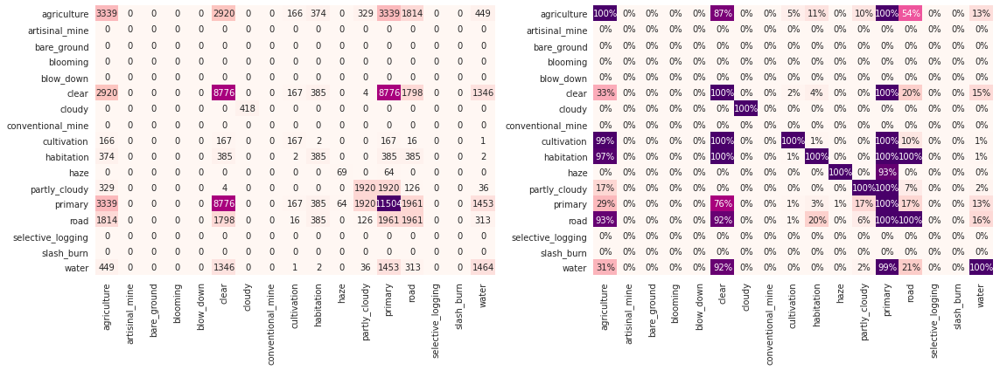

In [39]:
#@title Predictions Relation Matrix

plt.figure(figsize=(16, 6))
plt.subplot(121)
sns.heatmap(
  co_occurrence.numpy().astype(int),
  annot=True,
  fmt='d',
  xticklabels=CLASSES,
  yticklabels=CLASSES,
  cmap="RdPu",
  cbar=False
)

plt.subplot(122)
sns.heatmap(
  co_occurrence_rate.numpy(),
  annot=True,
  fmt='.0%',
  xticklabels=CLASSES,
  yticklabels=CLASSES,
  cmap="RdPu",
  cbar=False
)
plt.tight_layout();

## Generate Answers

In [40]:
%%bash

if [ ! -f /root/tensorflow_datasets/amazon-from-space/test-jpg.tfrecords ]; then
  mkdir -p /root/tensorflow_datasets/amazon-from-space/
  gdown --id 1M0S88-D1J59kHPr2vG3hpFaS7n8fOsRC --output /root/tensorflow_datasets/amazon-from-space/test-jpg.tfrecords
  # cp /content/drive/MyDrive/datasets/amazon-from-space/test-jpg.tfrecords \
  #   /root/tensorflow_datasets/amazon-from-space/
fi

Downloading...
From: https://drive.google.com/uc?id=1M0S88-D1J59kHPr2vG3hpFaS7n8fOsRC
To: /root/tensorflow_datasets/amazon-from-space/test-jpg.tfrecords
12.0GB [02:14, 89.6MB/s]


In [41]:
test_dataset = AmazonFromSpace.load('/root/tensorflow_datasets/amazon-from-space/test-jpg.tfrecords')

In [42]:
test = (
  test_dataset
  .map(lambda item: (item['filename'], load_fn(item)[0]), num_parallel_calls=tf.data.AUTOTUNE)
  .batch(64)
  .prefetch(Config.data.prefetch_buffer_size))

In [43]:
def filenames_and_probs(nn, dataset):
  labels_ = []
  probs_ = []

  for ix, (files, images) in enumerate(dataset):
    y = nn(images, training=False)
    y = tf.nn.sigmoid(y)

    labels_.append(files)
    probs_.append(y)

    print('.', end='' if ix % 200 else '\n')
  
  return (tf.concat(labels_, axis=0),
          tf.concat(probs_, axis=0))

In [44]:
files, preds = filenames_and_probs(nn, test)

.
........................................................................................................................................................................................................
........................................................................................................................................................................................................
........................................................................................................................................................................................................
........................................................................................................................................................................................................
............................................................................................................................................................

In [ ]:
detection_threshold = 0.5

answer = pd.DataFrame({
  'image_name': files.numpy().astype(str),
  'tags': [' '.join(AmazonFromSpace.int2str(p)) for p in (preds > detection_threshold).numpy()]
})
answer['image_name'] = answer.image_name.str.split('.').str[0]

answer.to_csv(os.path.join(Config.fine_tuning.logs, 'test_answer_swa_1-10_4.csv'), index=False)
answer.head()

In [ ]:
while True:pass

KeyboardInterrupt: ignored

In [ ]:
answer.head()